In [1]:
import numpy as np
import matplotlib.pyplot as plt

import imgaug.augmenters as iaa

import sys
sys.path.append("../Simulator")

import augmentations
import simulation
import plotting

# First load real data

In [2]:
original_data=np.load('../Data/processed_data/finfets_imgs.npy', allow_pickle=True)

and show it

This is sample index 0


/Users/jonasschuff/Documents/Projects/PSB_paper/Code_for_PSB_publication/Augmentation/plotting.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


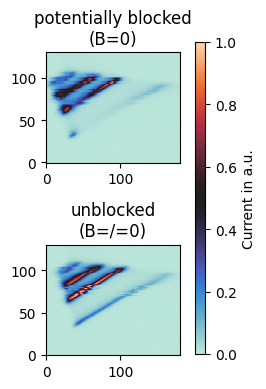

------
------
This is sample index 1


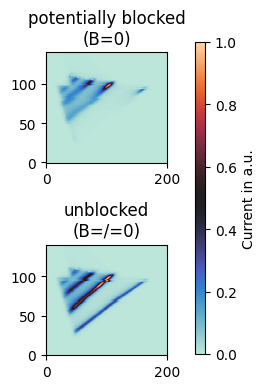

------
------
This is sample index 2


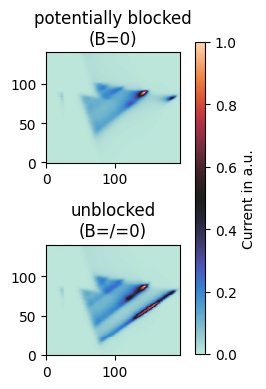

------
------
This is sample index 3


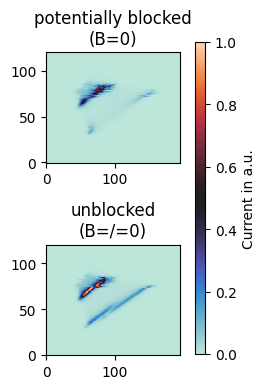

------
------
This is sample index 4


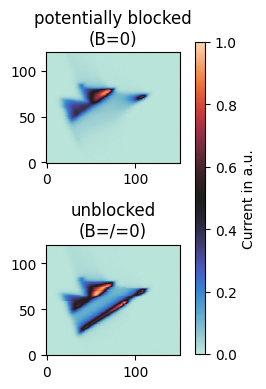

------
------
This is sample index 5


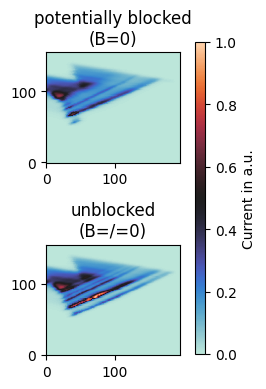

------
------
This is sample index 6


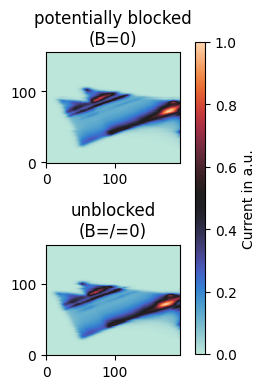

------
------
This is sample index 7


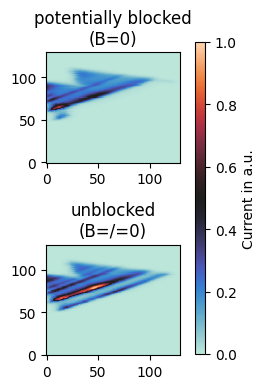

------
------
This is sample index 8


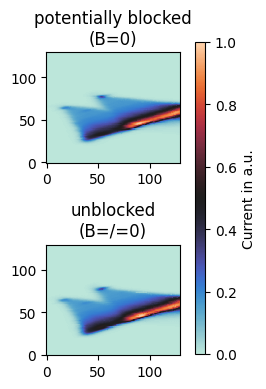

------
------
This is sample index 9


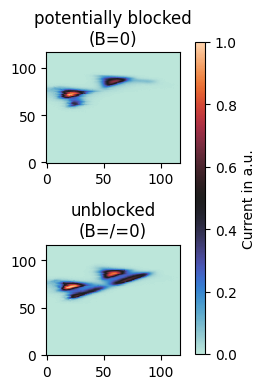

------
------
This is sample index 10


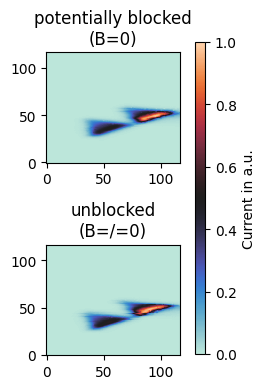

------
------
This is sample index 11


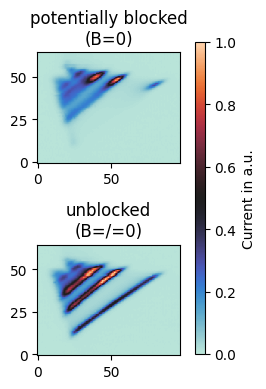

------
------
This is sample index 12


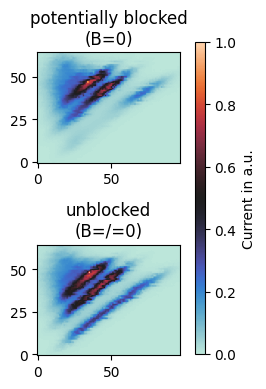

------
------
This is sample index 13


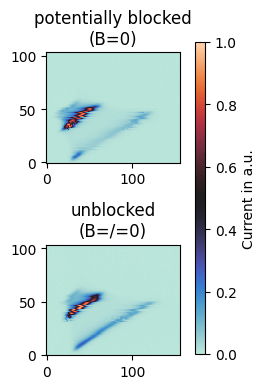

------
------
This is sample index 14


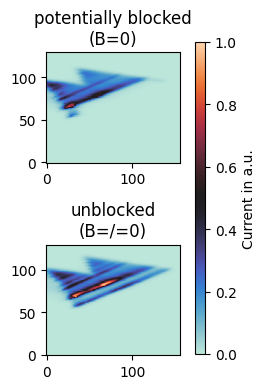

------
------
This is sample index 15


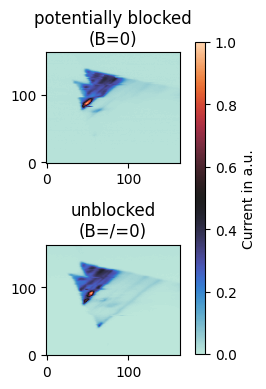

------
------
This is sample index 16


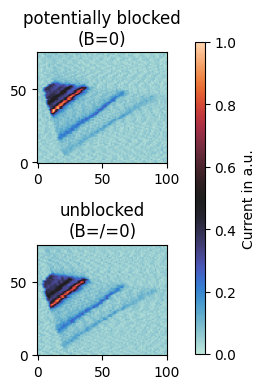

------
------
This is sample index 17


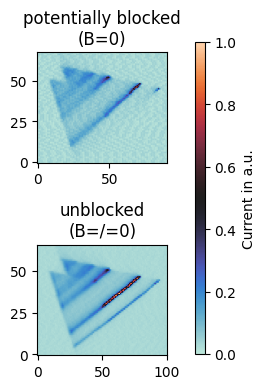

------
------
This is sample index 18


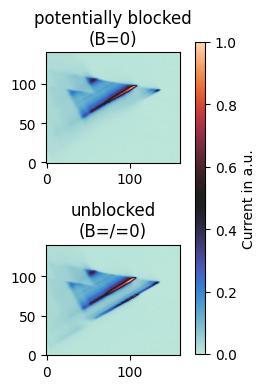

------
------
This is sample index 19


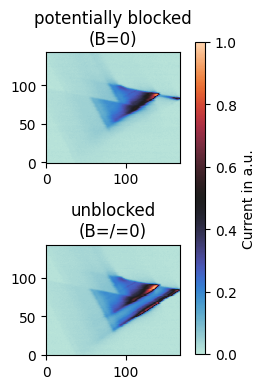

------
------
This is sample index 20


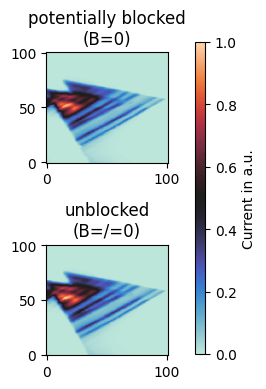

------
------
This is sample index 21


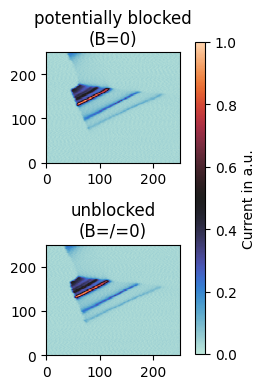

------
------
This is sample index 22


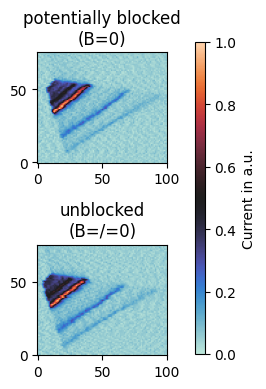

------
------
This is sample index 23


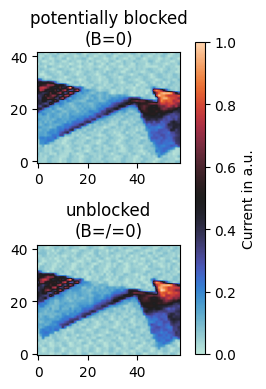

------
------
This is sample index 24


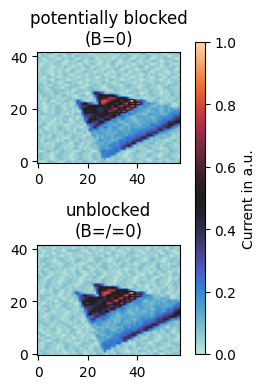

------
------
This is sample index 25


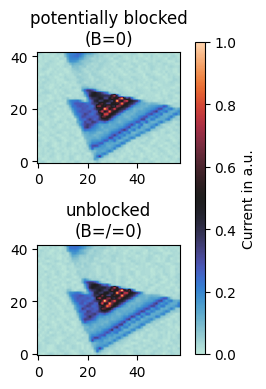

------
------
This is sample index 26


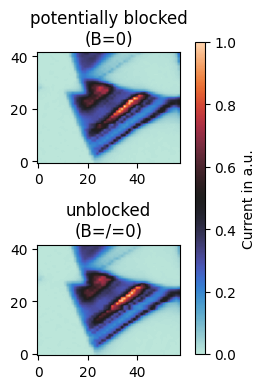

------
------
This is sample index 27


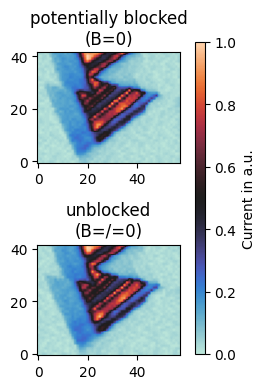

------
------
This is sample index 28


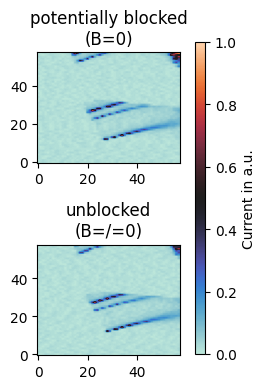

------
------
This is sample index 29


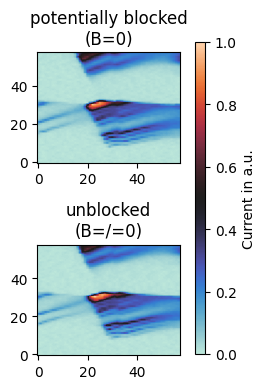

------
------
This is sample index 30


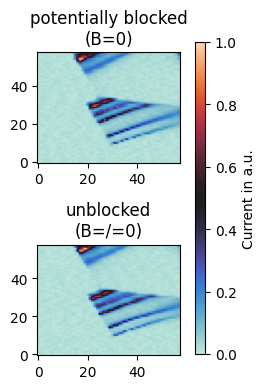

------
------
This is sample index 31


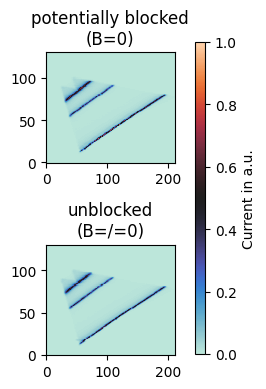

------
------
This is sample index 32


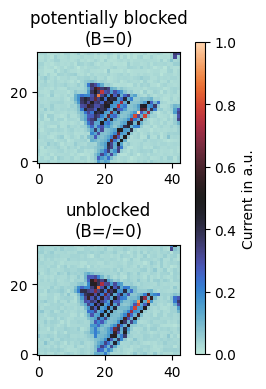

------
------
This is sample index 33


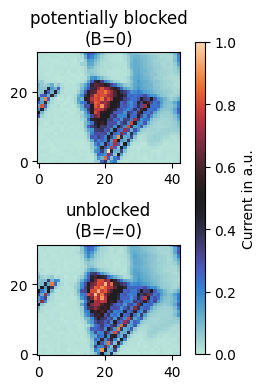

------
------
This is sample index 34


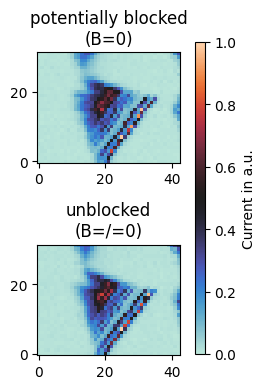

------
------
This is sample index 35


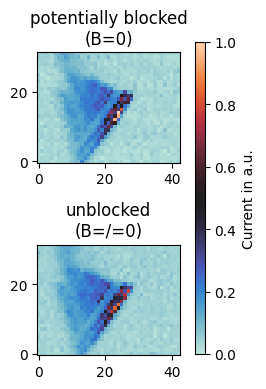

------
------
This is sample index 36


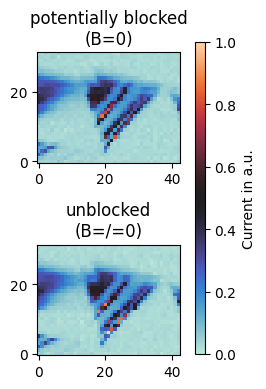

------
------
This is sample index 37


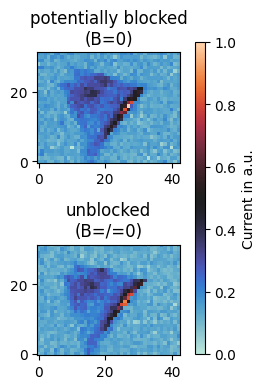

------
------
This is sample index 38


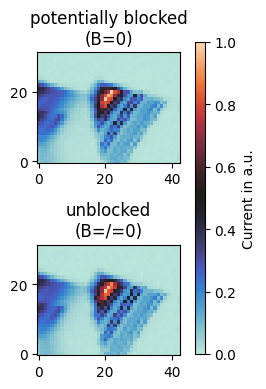

------
------
This is sample index 39


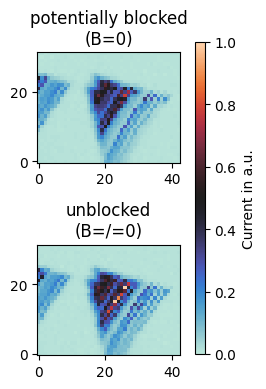

------
------
This is sample index 40


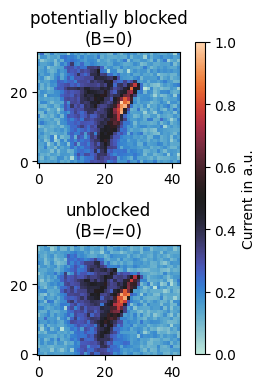

------
------
This is sample index 41


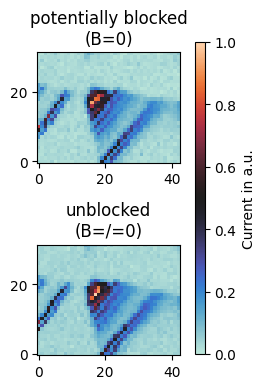

------
------
This is sample index 42


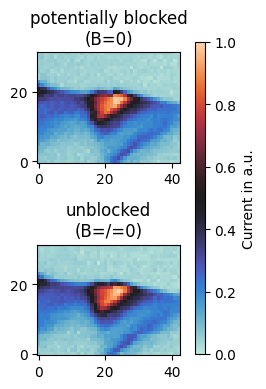

------
------
This is sample index 43


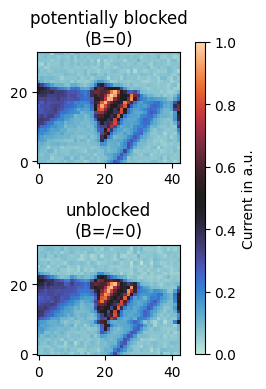

------
------
This is sample index 44


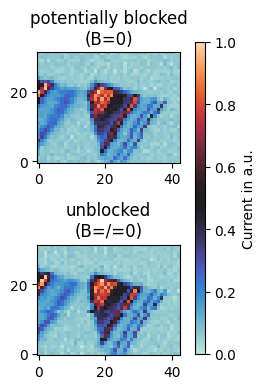

------
------
This is sample index 45


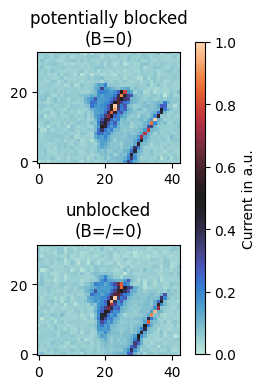

------
------
This is sample index 46


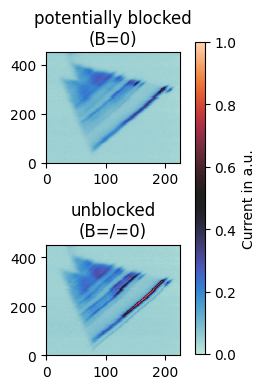

------
------
This is sample index 47


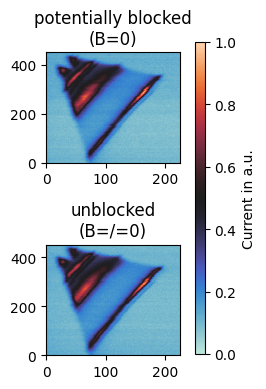

------
------
This is sample index 48


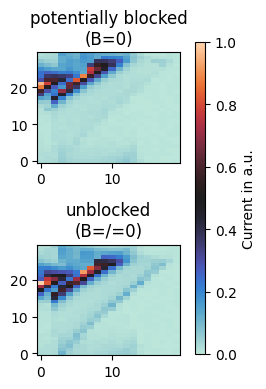

------
------
This is sample index 49


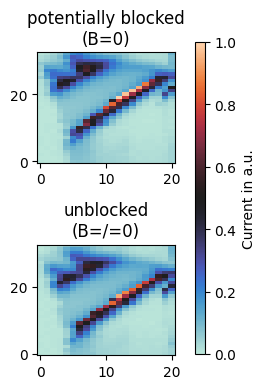

------
------
This is sample index 50


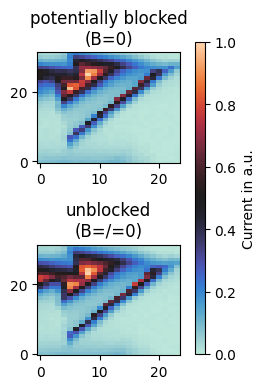

------
------
This is sample index 51


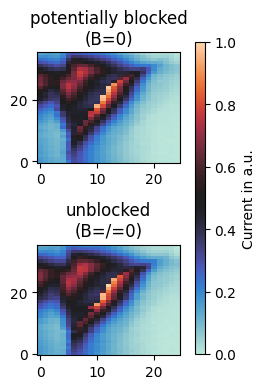

------
------
This is sample index 52


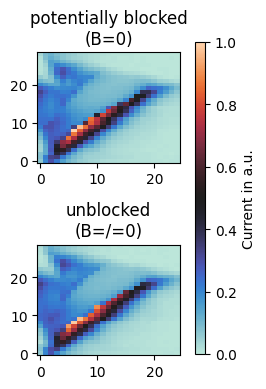

------
------


In [3]:
plotting.plot_samples(original_data)

the augmentation algorithm expects a uniformly sized data set, so we first resize the data set to have equal shapes and then augment it. The augmentation augments each sample exactly once.

In [4]:
resizer=iaa.Resize([100,100])

augmented_data=[]
for element in original_data:
    el0=resizer.augment_image(image=element[0])
    el1=resizer.augment_image(image=element[1])
    #im=normalise([el0,el1])
    augmented_data.append([el0,el1])

    
augmented_data=np.array(augmented_data)

augmented_data=augmentations.augment_batch_mp(augmented_data, n_workers=5)

This is sample index 0


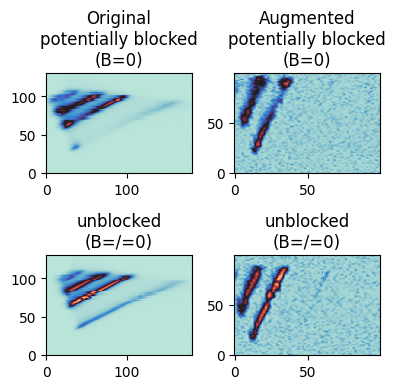

------
------
This is sample index 1


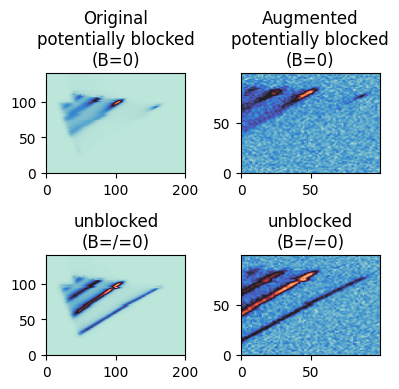

------
------
This is sample index 2


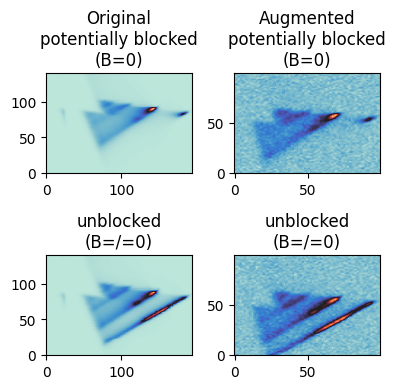

------
------
This is sample index 3


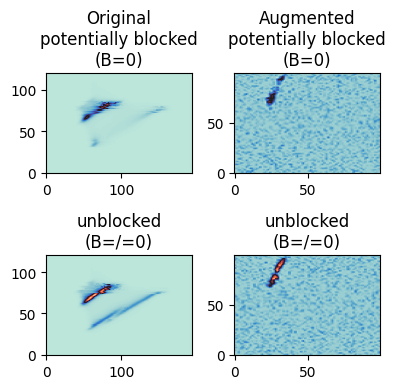

------
------
This is sample index 4


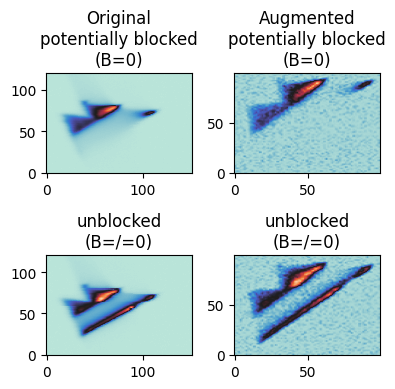

------
------
This is sample index 5


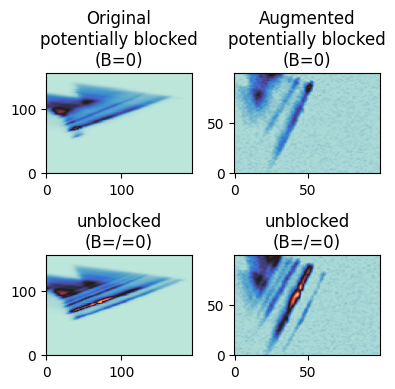

------
------
This is sample index 6


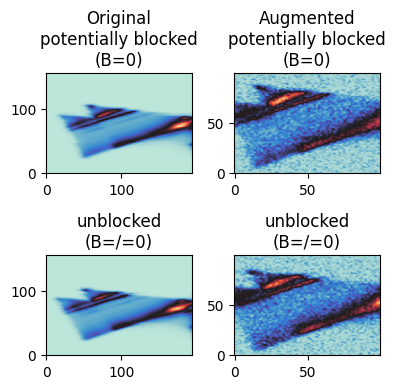

------
------
This is sample index 7


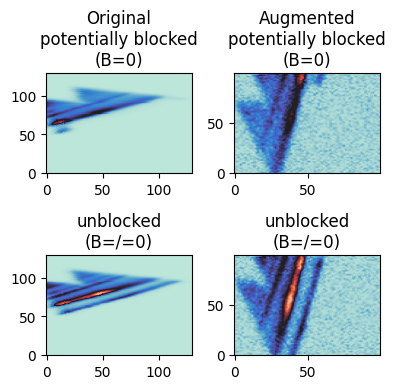

------
------
This is sample index 8


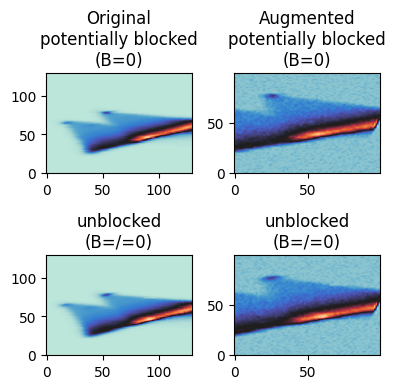

------
------
This is sample index 9


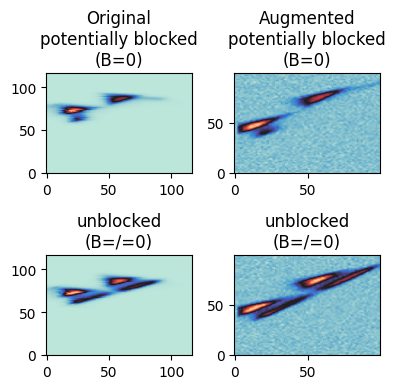

------
------
This is sample index 10


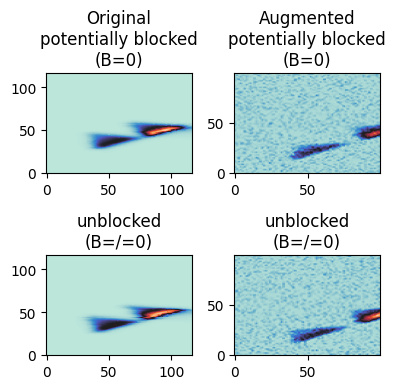

------
------
This is sample index 11


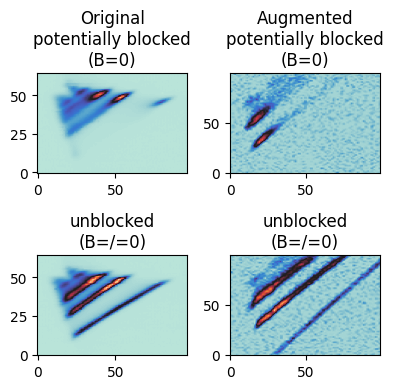

------
------
This is sample index 12


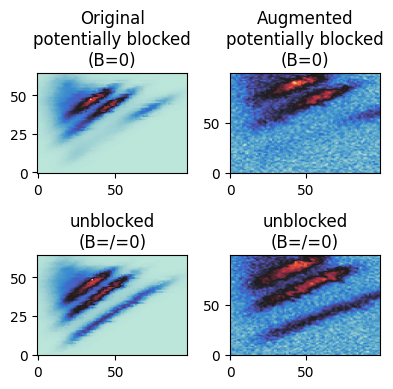

------
------
This is sample index 13


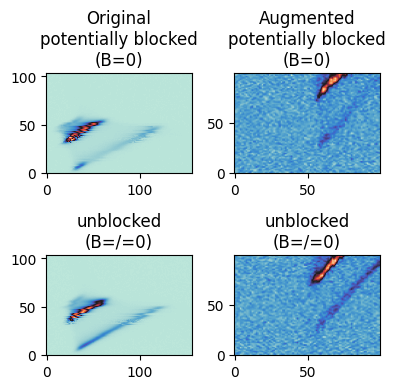

------
------
This is sample index 14


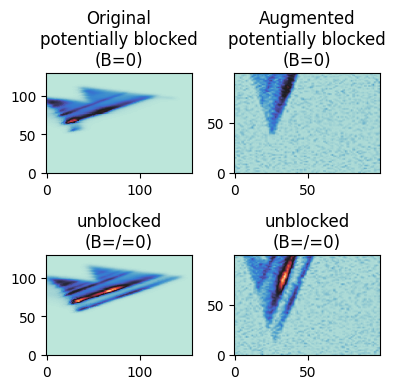

------
------
This is sample index 15


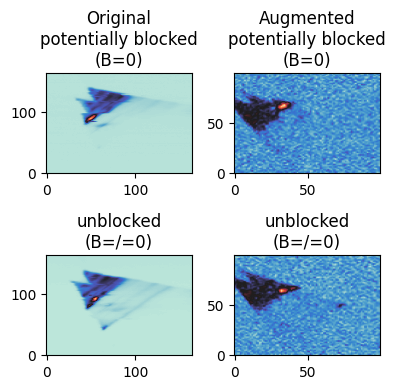

------
------
This is sample index 16


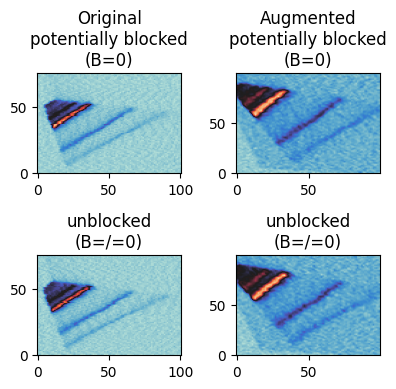

------
------
This is sample index 17


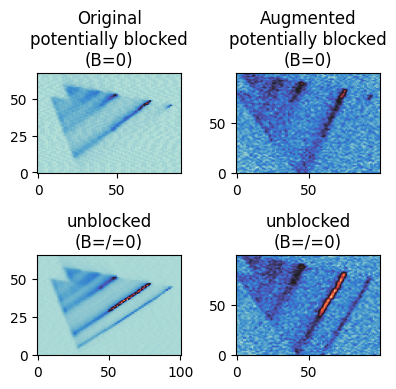

------
------
This is sample index 18


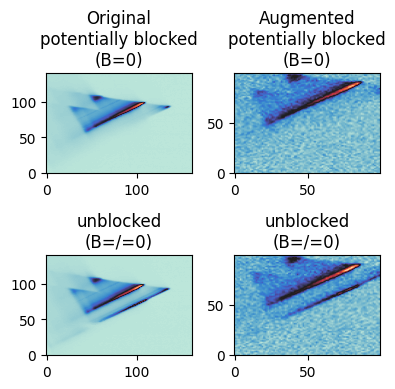

------
------
This is sample index 19


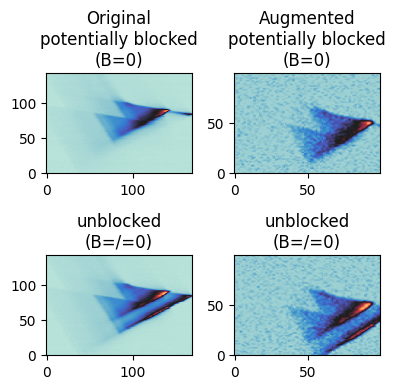

------
------
This is sample index 20


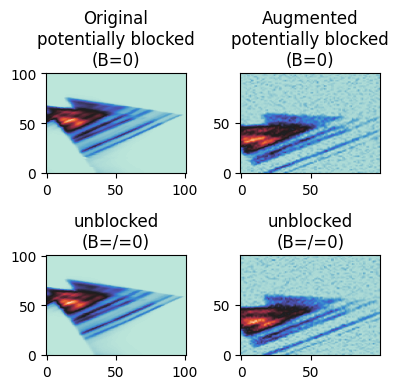

------
------
This is sample index 21


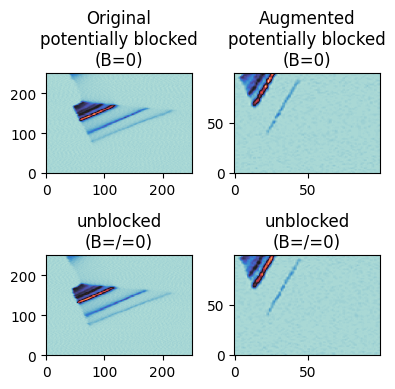

------
------
This is sample index 22


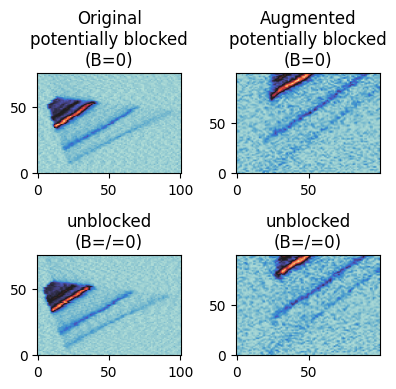

------
------
This is sample index 23


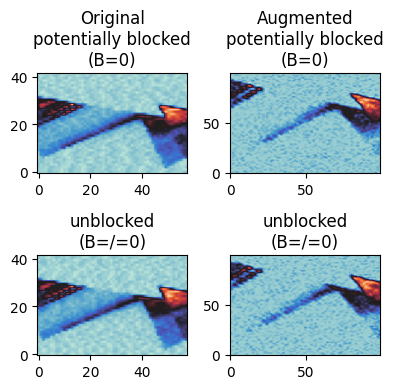

------
------
This is sample index 24


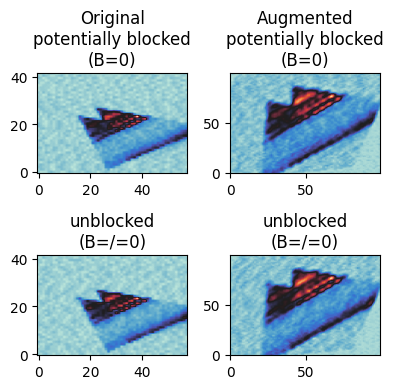

------
------
This is sample index 25


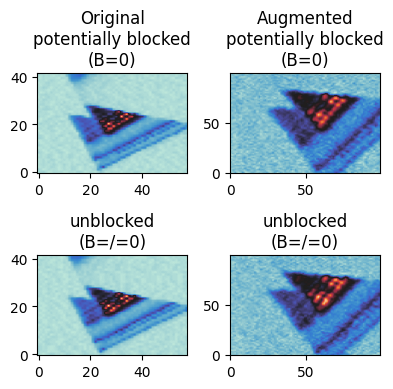

------
------
This is sample index 26


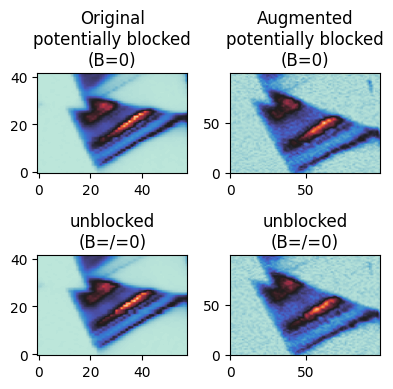

------
------
This is sample index 27


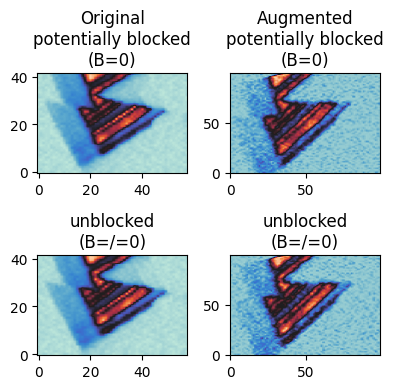

------
------
This is sample index 28


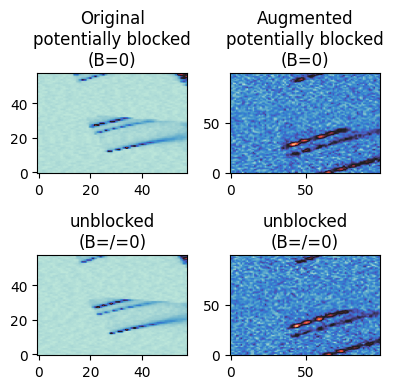

------
------
This is sample index 29


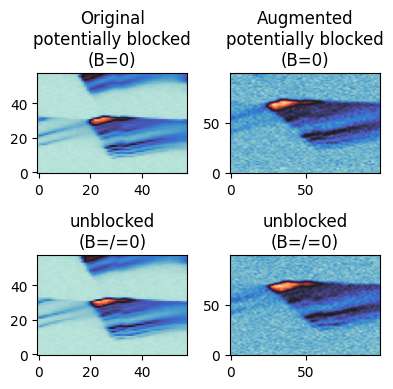

------
------
This is sample index 30


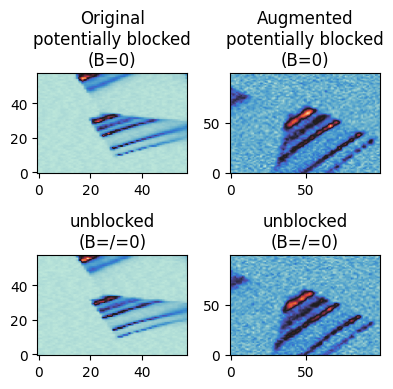

------
------
This is sample index 31


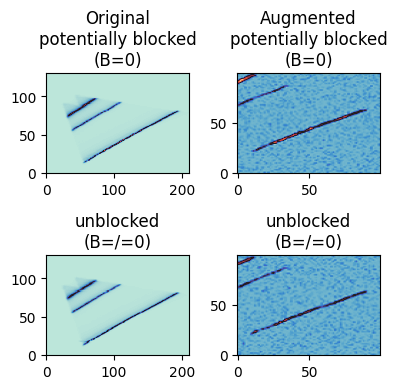

------
------
This is sample index 32


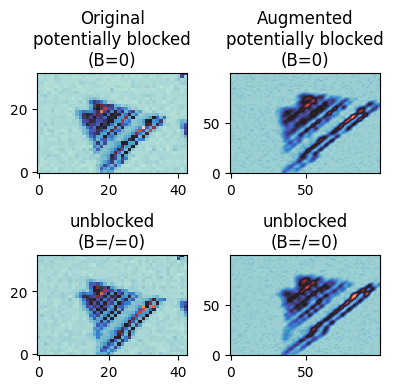

------
------
This is sample index 33


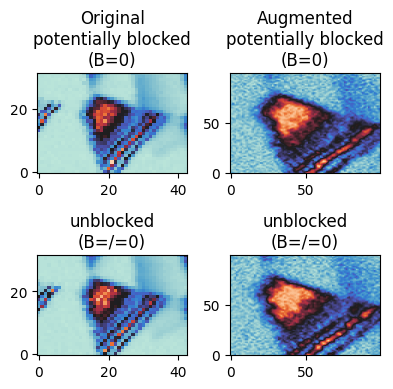

------
------
This is sample index 34


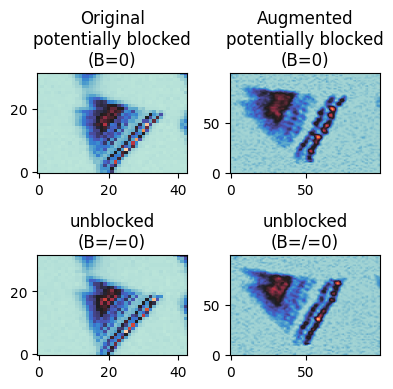

------
------
This is sample index 35


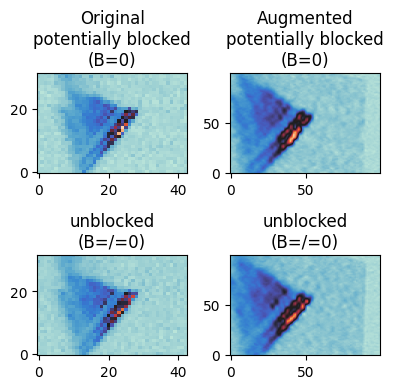

------
------
This is sample index 36


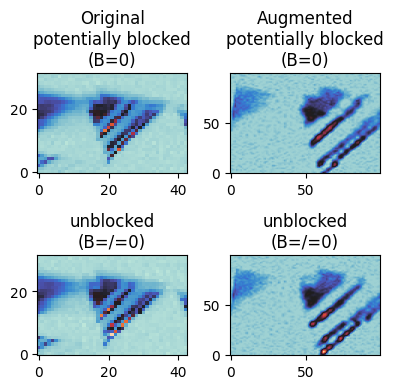

------
------
This is sample index 37


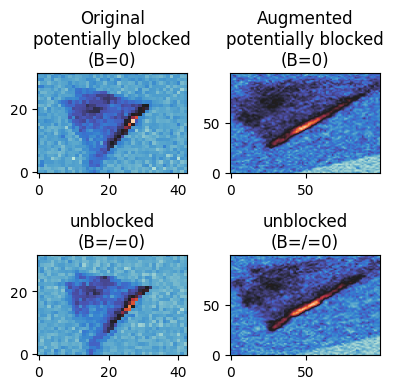

------
------
This is sample index 38


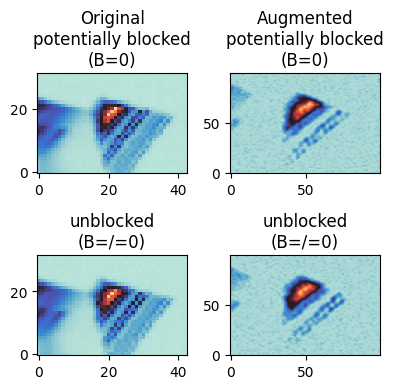

------
------
This is sample index 39


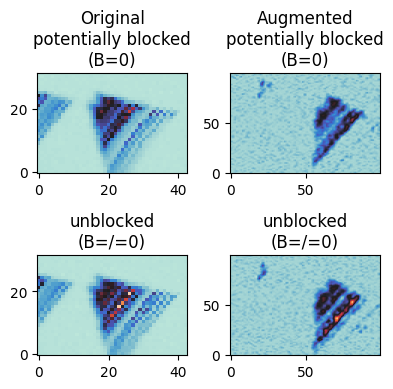

------
------
This is sample index 40


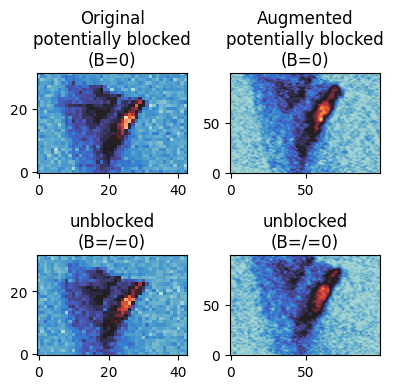

------
------
This is sample index 41


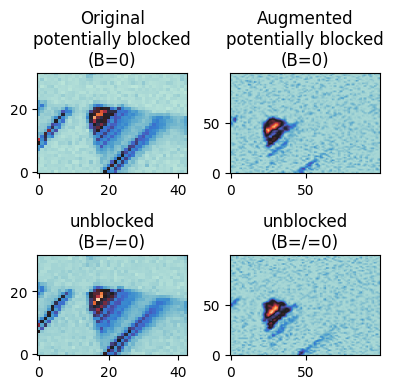

------
------
This is sample index 42


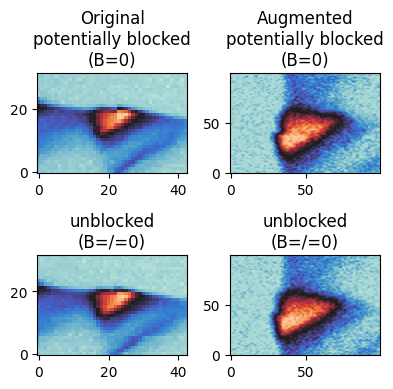

------
------
This is sample index 43


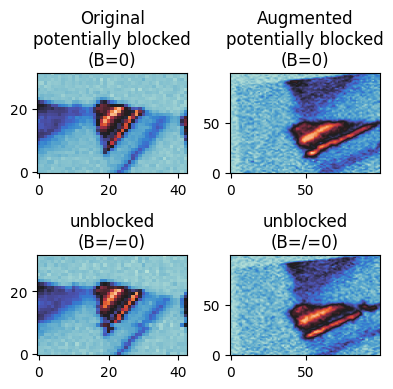

------
------
This is sample index 44


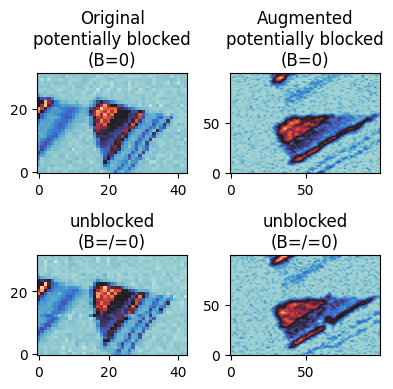

------
------
This is sample index 45


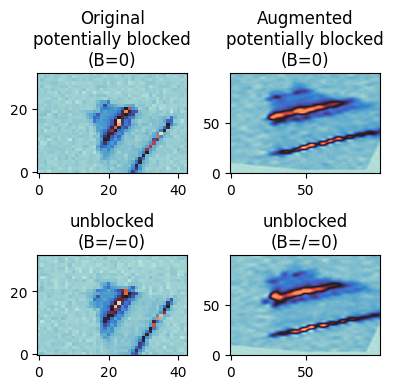

------
------
This is sample index 46


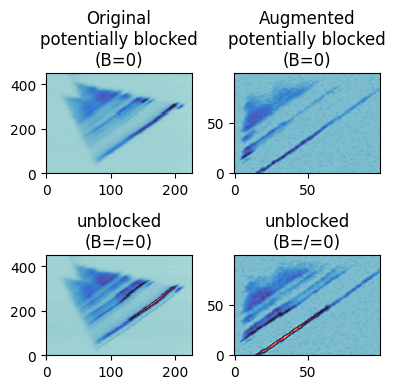

------
------
This is sample index 47


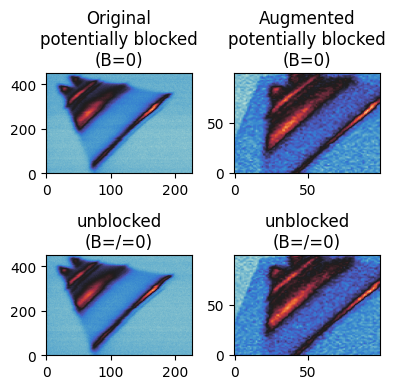

------
------
This is sample index 48


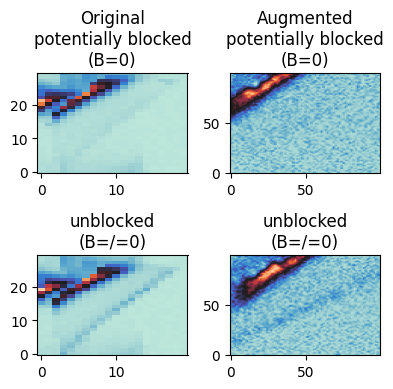

------
------
This is sample index 49


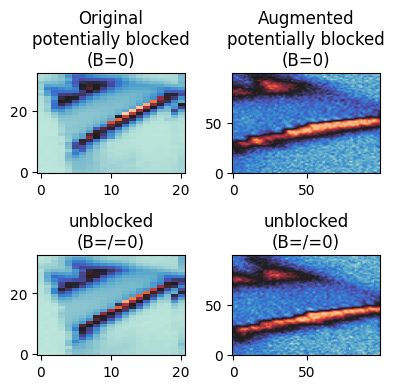

------
------
This is sample index 50


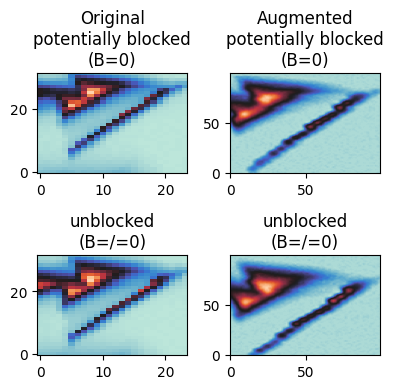

------
------
This is sample index 51


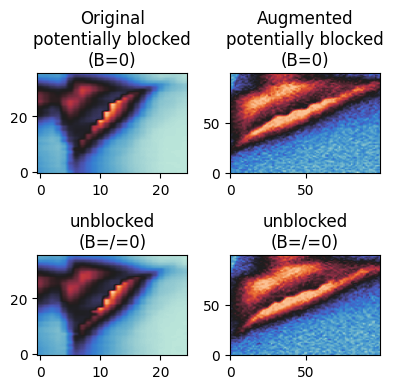

------
------
This is sample index 52


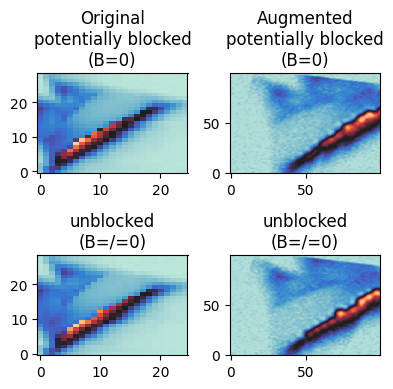

------
------


In [5]:
plotting.plot_samples_and_augmentation(original_data, augmented_data)

# Simulated data
is also augmented with the only difference that it is not sheared and stretched. First simulate some measurements

In [6]:
simulated_data,labels_simulated=simulation.simulate(10)
simulated_data=np.array(simulated_data)

  0%|          | 0/10 [00:00<?, ?it/s]

and show it

This is sample index 0


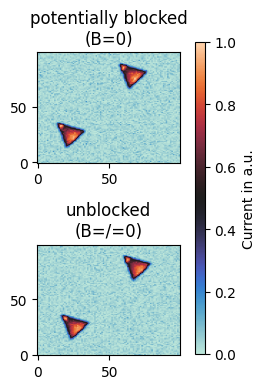

------
------
This is sample index 1


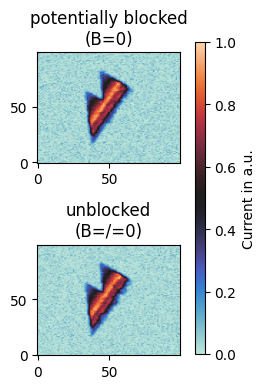

------
------
This is sample index 2


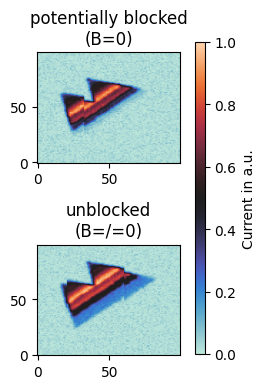

------
------
This is sample index 3


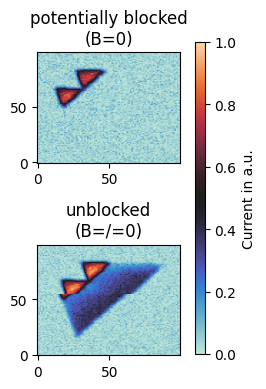

------
------
This is sample index 4


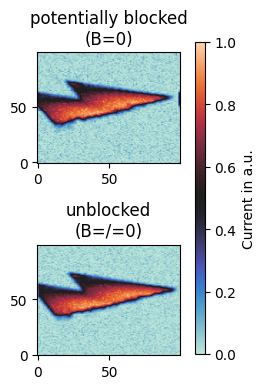

------
------
This is sample index 5


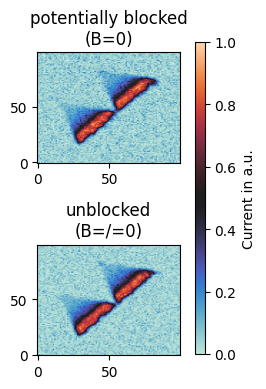

------
------
This is sample index 6


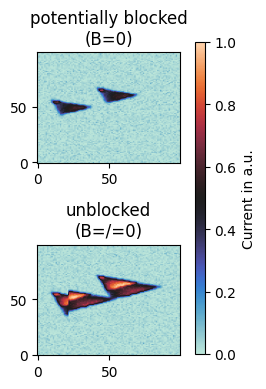

------
------
This is sample index 7


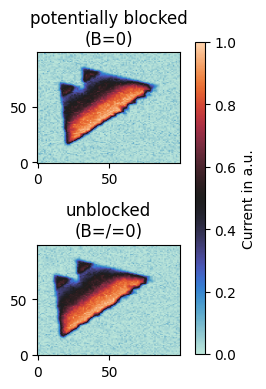

------
------
This is sample index 8


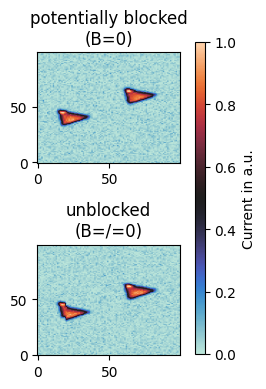

------
------
This is sample index 9


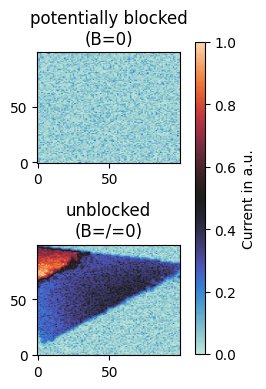

------
------


In [7]:
plotting.plot_samples(simulated_data)

We augment the data but without shearing and stretching. The variation in that regard should already be handled by the simulator.

In [8]:
augmented_simulated_data=augmentations.augment_batch_mp(simulated_data,shear_and_stretch=False, n_workers=40)

This is sample index 0


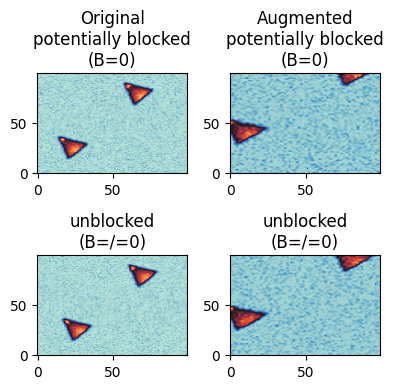

------
------
This is sample index 1


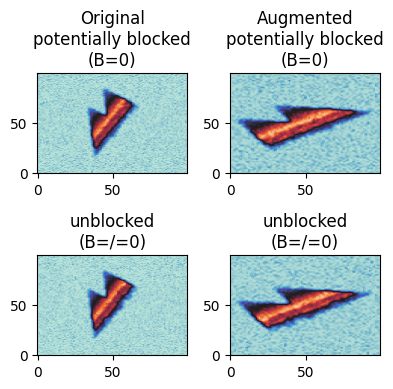

------
------
This is sample index 2


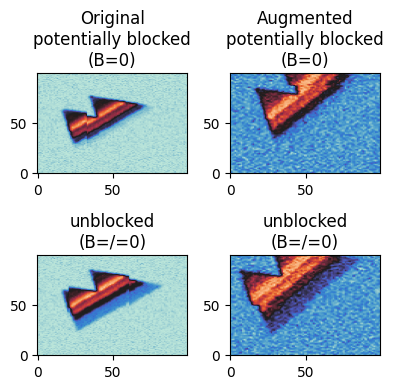

------
------
This is sample index 3


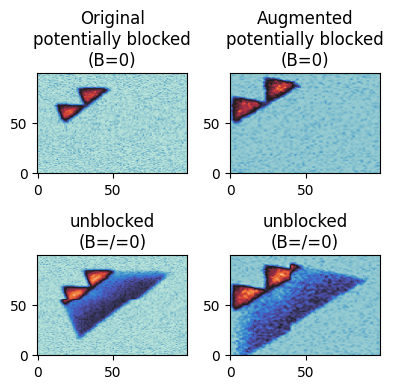

------
------
This is sample index 4


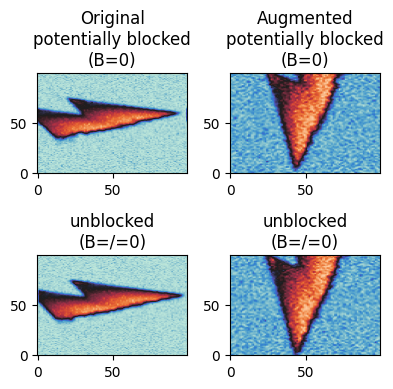

------
------
This is sample index 5


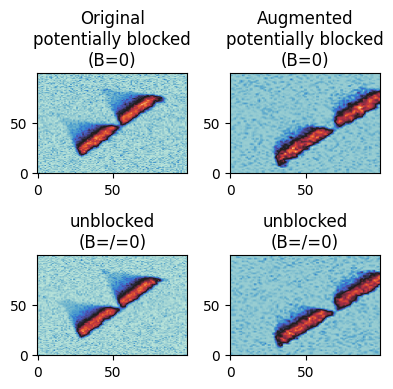

------
------
This is sample index 6


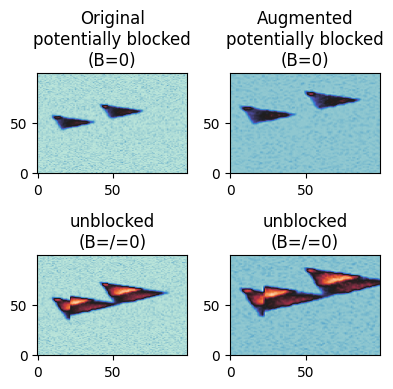

------
------
This is sample index 7


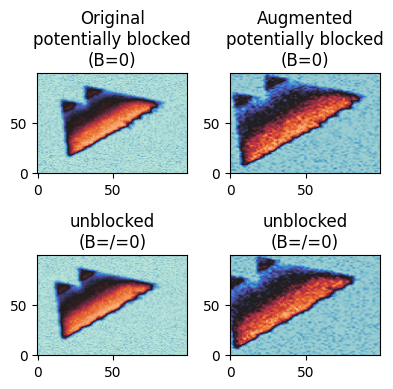

------
------
This is sample index 8


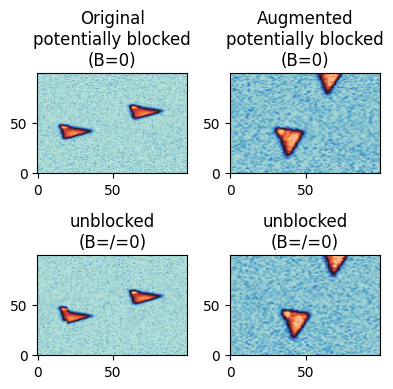

------
------
This is sample index 9


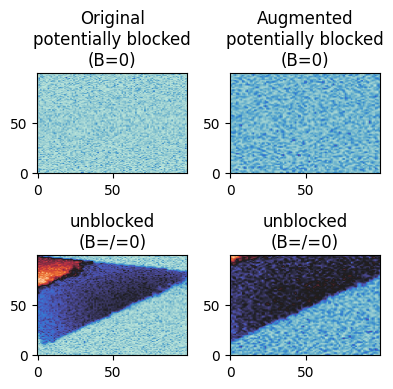

------
------


In [9]:
plotting.plot_samples_and_augmentation(simulated_data, augmented_simulated_data)
